In [2]:
import os
import sys
sys.path.append('..')
from optimization.input_data import load_forecasts, load_params, preprocess_data, load_costs
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import plotly.graph_objects as go
from optimization.utils import cdf_formula, pdf_formula
from scipy.integrate import quad
os.getcwd()

'c:\\Users\\Paulina\\OneDrive\\Desktop\\UNIVERSITYMASTER\\Masterarbeit\\Code2025\\Day-Ahead-Battery-Scheduling\\forecasting'

In [3]:
def custom_x_axis_formatter(x, pos, time):
    ''' Custom formatter for the x-axis. '''
    # Convert position (x) to index and get the corresponding timestamp
    index = int(x) if x < len(time) else len(time) - 1
    date = time[index]  # Access the corresponding Timestamp
    if date.hour == 0 or index == 0:  # First tick of the day
        return date.strftime('%d/%m/%Y\n%H:%M')  # Show "DD/MM HH"
    else:
        return date.strftime('%H:%M')  # Otherwise show "HH:MM"
    

def get_file_path(filename):
    ''' Get file path to store plots in a temporary folder for logging in mlflow. '''
    temp_folder = os.path.join(os.getcwd(), 'temporary_folder')
    os.makedirs(temp_folder, exist_ok=True)

    return os.path.join(temp_folder, filename)

## Load Data


In [ ]:


params_path = '../data/parameters/params_case4.json'
timeframe1 = ['2017-05-02 06:00:00', '2017-05-04 05:00:00'] # GT much more negative than forecasts
timeframe2 = ['2017-07-02 06:00:00', '2017-07-04 05:00:00'] # GT closer to zero than forecasts
timeframe3 = ['2017-06-09 06:00:00', '2017-06-11 05:00:00']
timeframe = timeframe1


# Ground truth
gt = pd.read_csv('../data/ground_truth/residential4_prosumption.csv', index_col=0)
gt.index = pd.to_datetime(gt.index)
if timeframe is not None:
    gt = gt.loc[timeframe[0]:timeframe[1]]

## Plot expected Prosumption

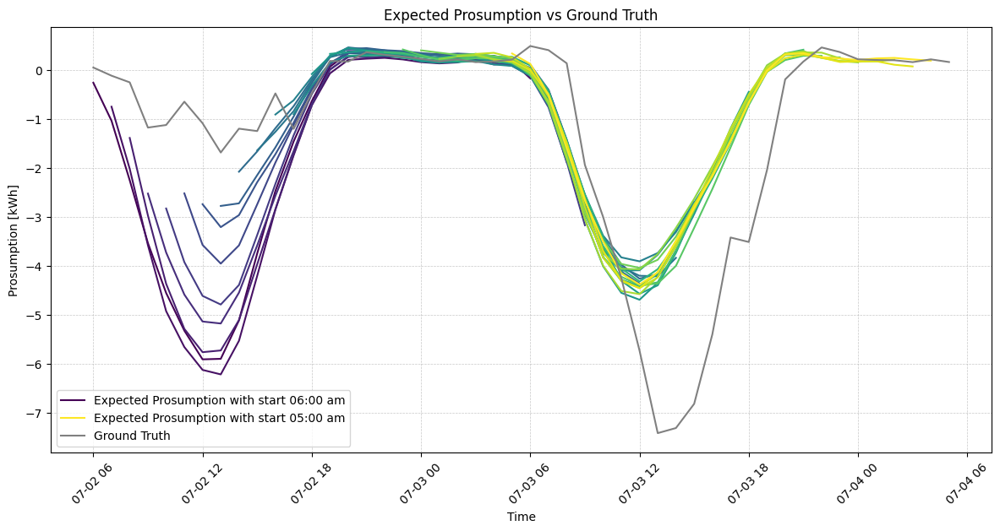

In [39]:
import matplotlib.dates as mdates
import matplotlib.cm as cm

# Create the plot
plt.figure(figsize=(12, 6))
colors = plt.cm.viridis(np.linspace(0, 1, 24))

for i in range(24):
    # Example 2: Sum of two gaussian distributions (reproduce paper results)
    hours_counter = (i+6)%24
    fc_folder = '../data/parametric_forecasts/gmm2_forecast_2025-04-03_hour_'+str(hours_counter)+'/' 
    # Load data
    forecasts = load_forecasts(fc_folder, timeframe)
    params = load_params(params_path)
    input_data = preprocess_data(forecasts, params)

    # Plot expcted prosumption with matplotlib
    fc_exp = input_data['fc_exp']
    if i ==0:
        plt.plot(fc_exp.index[i:i+24], fc_exp.values[i:i+24], label=f'Expected Prosumption with start 06:00 am', linestyle='-', marker='', color=colors[i])
    elif i==23:
        plt.plot(fc_exp.index[i:i+24], fc_exp.values[i:i+24], label=f'Expected Prosumption with start 05:00 am', linestyle='-', marker='', color=colors[i])

    else:
        plt.plot(fc_exp.index[i:i+24], fc_exp.values[i:i+24], linestyle='-', marker='', color=colors[i])
# Plot ground truth
gt_series = gt.iloc[:,0]
plt.plot(gt_series.index, gt_series.values, label='Ground Truth', linestyle='-', marker='', color='grey')

# Formatting
plt.title('Expected Prosumption vs Ground Truth')
plt.xlabel('Time')
plt.ylabel('Prosumption [kWh]')
plt.grid(True, which='both', linestyle='--', linewidth=0.5, alpha=0.7)
plt.legend()
plt.tight_layout()


# Rotate
plt.xticks(rotation=45)

# Save figure
file_path = get_file_path('prosumption_deviation_day2.png')
plt.savefig(file_path, dpi=300, bbox_inches = 'tight')

# Show the plot
plt.show()

## Plot prosumption uncertainties


In [43]:

for i in range(4):
    # Example 2: Sum of two gaussian distributions (reproduce paper results)
    hours_counter = (i+6)%24
    fc_folder = '../data/parametric_forecasts/gmm2_forecast_2025-04-03_hour_'+str(hours_counter)+'/' 
    # Load data
    forecasts = load_forecasts(fc_folder, timeframe)
    params = load_params(params_path)
    input_data = preprocess_data(forecasts, params)


    uncertainty_form = input_data['pdf/cdf name']
    uncertainty_weights = input_data['fc_weights']

    uncertainty_form = 'sum-2-gaussian-distributions'
    # Iterate through the uncertainty weights
    pdf = pdf_formula(uncertainty_form)

    pdfs_dist = []
    x = np.linspace(-30, 30, 3000)
    x_total = []
    for t in uncertainty_weights.index:
        weights = uncertainty_weights.loc[t]

        y = []
        x_new = []
        for xi in x:
            try:
                yi = pdf(xi, *weights)
                y.append(yi)
                x_new.append(xi)
            except OverflowError:
                continue

        pdfs_dist.append(y)
        x_total.append(x_new)

    # Create the figure
    fig = go.Figure()

    # Add each timestep as a trace with its time as the label
    for i, t in enumerate(uncertainty_weights.index[i:i+24]):
        fig.add_trace(go.Scatter(x=x_total[i], y=pdfs_dist[i], mode='lines', name=f'Time {t.strftime('%H:%M %d-%m-%Y')}'))

    fig.update_layout(
        title='Probability Density Functions - All Time Steps',
        xaxis_title='Prosumption-Uncertainty [kW]',
        yaxis_title='Probability Density',
        xaxis=dict(showgrid=True, gridwidth=1, gridcolor='LightGray', range=[-20, 20]),
        yaxis=dict(showgrid=True, gridwidth=1, gridcolor='LightGray', range=[-0.1, 5]),
        legend_title_text='Timesteps',
        #width=1600,  # Adjust the width of the plot
        #height=1000  # Adjust the height of the plot
    )

    fig.show()